# Identification
Please indicate your name

Student 1: Erisa Kohansal

Student 2: Sama Satariyan

# Practical work 8: Color quantification and search by content


In this practical work session, we will:

- Develop a color based descriptor that can be applied to every image in a database
- Use this color descriptor to create a method that searches images by content: the goal is to find the images that are the most similar to a query.

In [1]:
# Load useful library

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import scipy.signal
import scipy.ndimage
from skimage.color import rgb2hsv, hsv2rgb

# Usefull functions
def setColors(nH, nS, nV):
    """ int**3 -> Array[nH*nS*nV,3]*Array[nH,nS,nV,3]
        computes an RGB palette from a sampling of HSV values
    """
    pal1 = np.zeros((nH*nS*nV, 3))
    pal2 = np.zeros((nH, nS, nV, 3))
    tH, tS, tV = 1/(2*nH), 1/(2*nS), 1/(2*nV)

    idx = 0
    for i in range(nH):
        for j in range(nS):
            for k in range(nV):
                HSVval = np.array([[[i/nH + tH, j/nS + tS, k/nV + tV]]])
                pal1[idx, :] = hsv2rgb(HSVval)*255  
                pal2[i, j, k, :] = hsv2rgb(HSVval)*255
                idx += 1
    return pal1, pal2

def viewQuantizedImage(I,pal):
    """ Array*Array -> Array
        Display an indexed image with colors according to pal 
    """
    Iview = np.empty(I.shape)
    n, m, c = I.shape
    for i in range(n):
        for j in range(m):
            h, s, v = I[i, j, :]
            Iview[i, j, :] = pal[ int(h), int(s), int(v), :]
    print( Iview.max())
    plt.imshow(Iview/255)
    plt.show()

def display5mainColors(histo, pal):
    """ Array*Array -> NoneType
        Display the 5 main colors in histo 
    """
    idx = np.argsort(histo)
    idx = idx[::-1]
    K = 5
    for i in range (K):
        Ia = np.zeros((1, 1, 3), dtype=np.uint8)
        Ia[0,0,0] = pal[idx[i], 0]
        Ia[0,0,1] = pal[idx[i], 1]
        Ia[0,0,2] = pal[idx[i], 2]
        plt.subplot(1, K, i+1)
        plt.imshow(Ia)
        plt.axis('off')
    plt.show()

def display20bestMatches(S, indexQuery):
    """ Array*int -> NoneType 
    """
    L = S[indexQuery, :]
    Idx = np.argsort(L)[::-1]
    cpt = 1
    plt.figure(figsize=(15, 10))
    for idx in Idx[:20]:
        plt.subplot(5, 4, cpt)
        indexQuery = idx
        imageName = (pathImage+listImage[indexQuery]).strip()
        plt.imshow(np.array(Image.open(imageName))/255.)
        plt.title(listImage[indexQuery])
        plt.axis('off')
        cpt += 1
    plt.show()

## Exercise 1: HSV histogram computation

Each image of the base will be represented by its color histogram in the HSV representation. We use the HSV representation rather than the RGB representation because it is a perceptual color space: two colors that look similar will have close HSV vectors.

1) Write a function ```iv = quantize(v,K)``` that returns the quantized interval of `v` considering a uniform quantization of values over the range $[0,1]$ with `K` evenly spaced intervals. For an image value v=1, the function will return K-1.

In [2]:
def quantize(I, k):
    """ float*int -> int 
    """
    return np.minimum(np.floor(I*k), (k-1)).astype(int)


# You can test your function with the following lines:
h = np.zeros((8))
for i in range(256):
    h[quantize(i/255.,8)] += 1
assert (h == 32*np.ones((8))).all()

2) Write a function ```[Iq, histo] = quantizeImage(I,Nh,Ns,Nv)``` that takes as input one image I of size N x M x 3 in the HSV representation and the number of quantification interval needed for H, S and V. 
    Your function will return: 
 *    ```Iq```: the quantified image for each channel, of size N x M x 3
 *   ```hist```: a 3D histogram of size Nh x Ns x Nv that counts the number of pixels for each quantification bin (iH, iS, iV)

In [3]:
def quantizeImage(I, nH, nS, nV):
    """ Array*int -> Array*Array
    """
    N, M, _ = I.shape
    Iq = np.zeros(I.shape, dtype=int)
    h = np.zeros((nH, nS, nV))
    for i in range(N):
        for j in range(M):
            Iq[i,j,:] = [quantize(I[i,j,0],nH), quantize(I[i,j,1],nS), quantize(I[i,j,2],nV)]
            h[Iq[i,j,0], Iq[i,j,1], Iq[i,j,2]] += 1
    return Iq, h


3) Write a function ```normalized_histo = NormalizeHistL2(histo)``` that applies a normalization on the histogram ```histo``` according to the L2 norm.
The L2 norm of x can be computed using the function ```numpy.linalg.norm(x,2)```



In [4]:
def normalize(H):
    """ Array -> Array"""
    return H/np.linalg.norm(H, 2)

4) Test the HSV histogram on an image: Complete the following code with your functions in order to apply it on one of the images of the base. The code will follow the following steps:
   1. Open the image and convert it into HSV representation.
   2. Compute the color palette for the display using the given ```setColors(nH, nS, nV)``` function.
   3. Compute the quantization of the image then visualize the quantized image using ```viewQuantizedImage(I,pal) ```.
   4. Transform the 3D histogram into a 1D histogram, normalize it according to L2 norm then visualize it.
   5. Display the 5 most prevalent colors on the image using ```display5mainColors(histo, pal)```.

   You can try this on the image ```Paysages67.png```with ```nH = 12```, ```nS = 3```  and ```nV = 8``` and find a result similar to Figures 1, 2, 3, and 4.

![figure1](./figs/Figure_1.png)
<center>Figure 1: Paysage67.png</center>

![figure2](./figs/Figure_2.png)
<center>Figure 2: Paysage67.png quantized</center>

![figure3](./figs/Figure_3.png)
<center>Figure 3: Histogram of HSV image (288 bins)</center>

![figure4](./figs/Figure_4.png)
<center>Figure 4: 5 main colors</center>


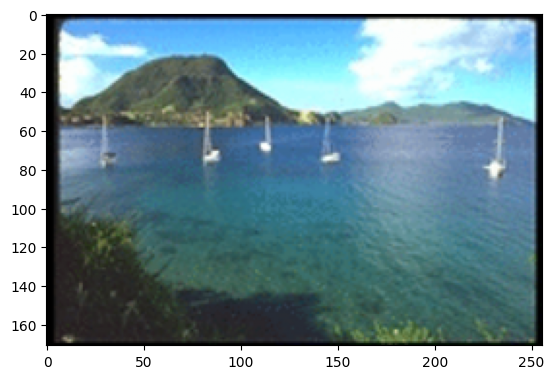

239.0625


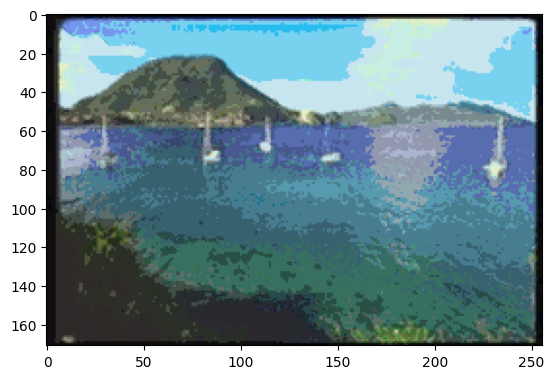

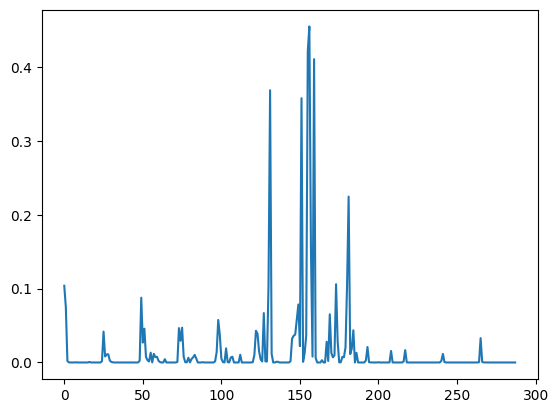

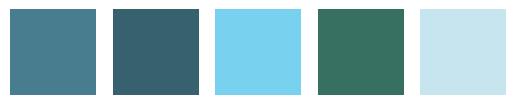

[(np.int64(6), np.int64(1), np.int64(4)), (np.int64(6), np.int64(1), np.int64(3)), (np.int64(6), np.int64(1), np.int64(7)), (np.int64(5), np.int64(1), np.int64(3)), (np.int64(6), np.int64(0), np.int64(7))]


In [5]:
PathImage = './Base/'  # to be completed
nom = 'Paysages67.png'  # to be completed

# quantization parameters
nH = 12 # to be completed
nS = 3 # to be completed
nV = 8 # to be completed


filename= nom;
I = np.array(Image.open(PathImage + filename))
I = I / 255.  # I values range in [0,1]
plt.figure();
plt.imshow(I);
plt.show()

# conversion RGB->HSV
J = rgb2hsv(I)

# color palette computation
palette, palette2 = setColors( nH, nS , nV );

# Image quantization (your function)
Iq, histo = quantizeImage(J, nH, nS, nV)

# Visualisation of quantized image
viewQuantizedImage(Iq , palette2)

# flat a 3D histogram to 1D
histo = histo.flat

# Histogram normalization (your function)
histo = normalize(histo)

plt.figure()
plt.plot(histo)
plt.show()


## Determine 5 more frequent colors
idx_most_prevalent = (-histo).argsort()[:5]
hsv_most_prevalent = [np.unravel_index(idx,( nH, nS , nV )) for idx in idx_most_prevalent]

display5mainColors(histo, palette)

print(hsv_most_prevalent)


239.0625
[(np.int64(6), np.int64(1), np.int64(4)), (np.int64(6), np.int64(1), np.int64(3)), (np.int64(6), np.int64(1), np.int64(7)), (np.int64(5), np.int64(1), np.int64(3)), (np.int64(6), np.int64(0), np.int64(7))]


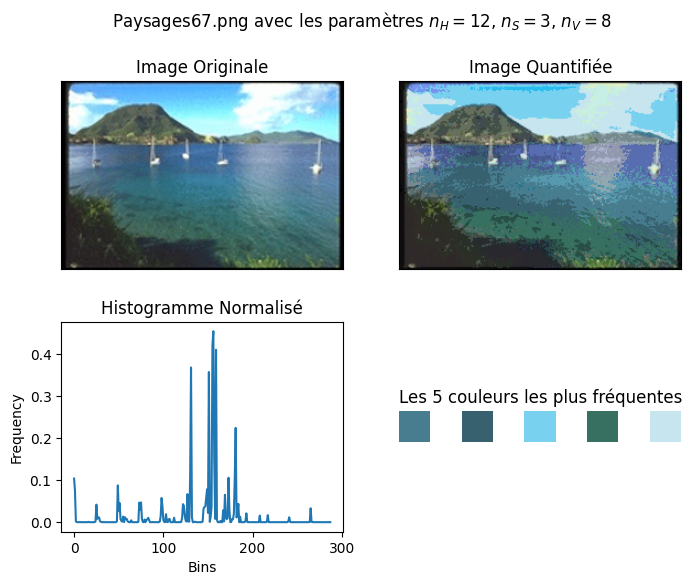

In [6]:
def afficheHSV(filename, nH, nS, nV, PathImage='./Base/', figsize=(8,6)):
    I = np.array(Image.open(PathImage + filename))
    I = I / 255.  # I values range in [0,1]

    fig, ax = plt.subplots(nrows=2, ncols=2, figsize=figsize)
    fig.suptitle("{:} avec les paramètres $n_H=${:}, $n_S=${:}, $n_V=${:}".format(filename, nH, nS, nV))

    ax[0,0].set_title("Image Originale")
    ax[0,0].imshow(I)
    ax[0,0].set_xticks(())
    ax[0,0].set_yticks(())

    # conversion RGB->HSV
    J = rgb2hsv(I)
    # color palette computation
    palette, palette2 = setColors(nH, nS, nV)
    # Image quantization (your function)
    Iq, histo = quantizeImage(J, nH, nS, nV)
    # Visualisation of quantized image
    # viewQuantizedImage(Iq , palette2)
    Iview = np.empty(Iq.shape)
    n, m, _ = Iq.shape
    for i in range(n):
        for j in range(m):
            h, s, v = Iq[i, j, :]
            Iview[i, j, :] = palette2[int(h), int(s), int(v), :]
    print(Iview.max())
    ax[0,1].set_title("Image Quantifiée")
    ax[0,1].imshow(Iview/255)
    ax[0,1].set_xticks(())
    ax[0,1].set_yticks(())

    # flat a 3D histogram to 1D
    histo = histo.flat
    # Histogram normalization (your function)
    histo = normalize(histo)
    ax[1,0].set_title("Histogramme Normalisé")
    ax[1,0].plot(histo)
    ax[1,0].set_xlabel("Bins")
    ax[1,0].set_ylabel("Frequency")

    ## Determine 5 more frequent colors
    idx_most_prevalent = (-histo).argsort()[:5]
    hsv_most_prevalent = [np.unravel_index(idx,( nH, nS , nV )) for idx in idx_most_prevalent]
    #display5mainColors(histo, palette)
    idx = np.argsort(histo)
    idx = idx[::-1]
    K = [0, 2, 4, 6, 8]
    colors = np.zeros((1,9,3), dtype=int)
    colors[:,:,:] = 255
    for i, n in enumerate(K):
        colors[0,n,0] = palette[idx[i], 0]
        colors[0,n,1] = palette[idx[i], 1]
        colors[0,n,2] = palette[idx[i], 2]
    ax[1,1].set_title("Les 5 couleurs les plus fréquentes")
    ax[1,1].imshow(colors/255)
    ax[1,1].axis("off")

    print(hsv_most_prevalent)
    plt.show()

afficheHSV("Paysages67.png", 12, 3, 8)

5) Change the values of ```nH```, ```nS```  and ```nV``` and analyze the results. You can try with other images in the base.

239.0625
[(np.int64(0), np.int64(1), np.int64(3)), (np.int64(0), np.int64(1), np.int64(4)), (np.int64(0), np.int64(0), np.int64(7)), (np.int64(0), np.int64(0), np.int64(1)), (np.int64(0), np.int64(1), np.int64(7))]


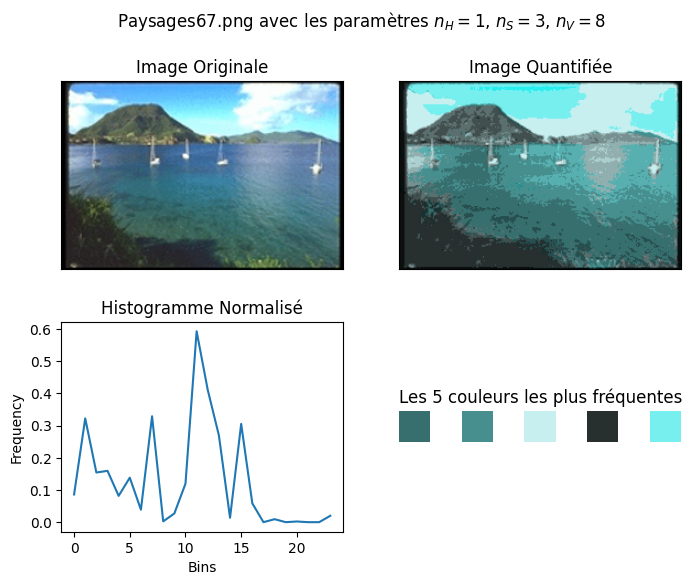

239.0625
[(np.int64(5), np.int64(1), np.int64(3)), (np.int64(6), np.int64(1), np.int64(5)), (np.int64(5), np.int64(0), np.int64(7)), (np.int64(6), np.int64(1), np.int64(4)), (np.int64(6), np.int64(1), np.int64(7))]


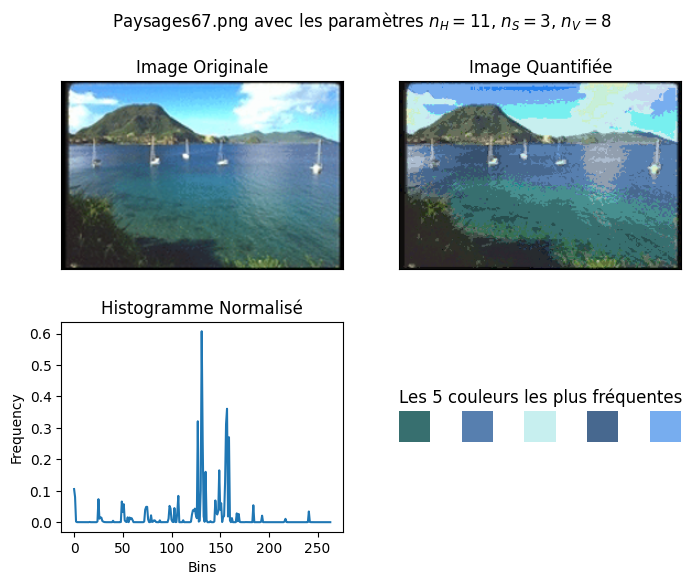

239.0625
[(np.int64(10), np.int64(1), np.int64(3)), (np.int64(11), np.int64(1), np.int64(4)), (np.int64(12), np.int64(1), np.int64(5)), (np.int64(10), np.int64(0), np.int64(7)), (np.int64(11), np.int64(1), np.int64(7))]


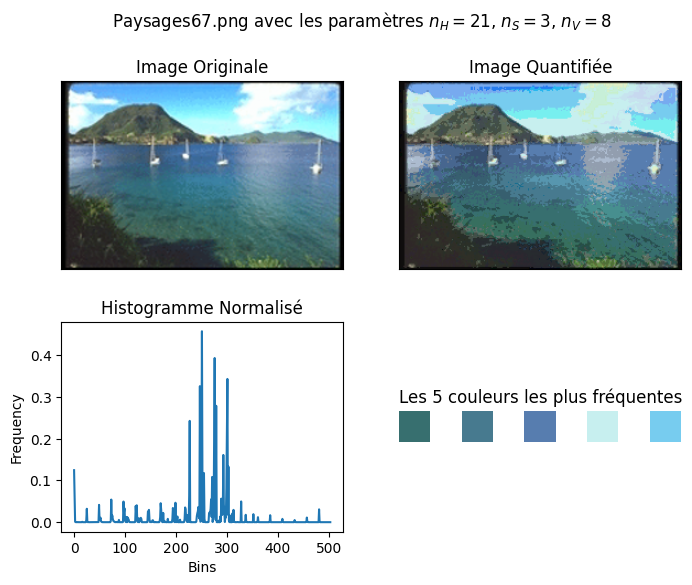

239.0625
[(np.int64(15), np.int64(1), np.int64(3)), (np.int64(16), np.int64(1), np.int64(4)), (np.int64(18), np.int64(1), np.int64(5)), (np.int64(15), np.int64(0), np.int64(7)), (np.int64(17), np.int64(1), np.int64(7))]


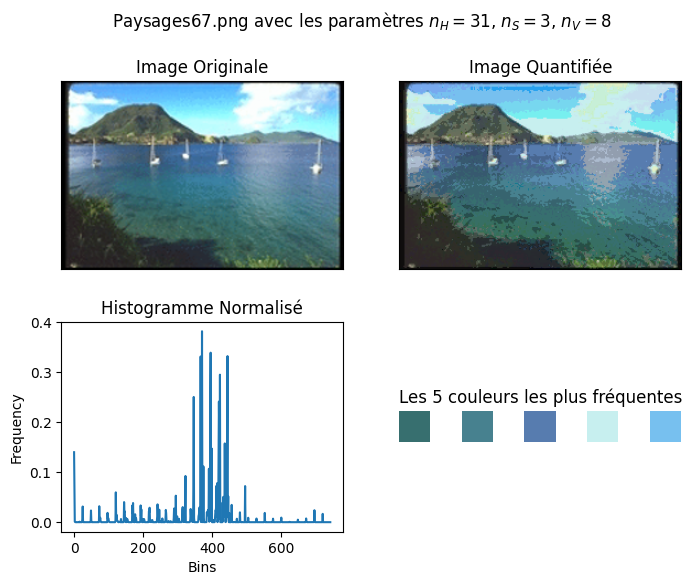

239.0625
[(np.int64(20), np.int64(0), np.int64(7)), (np.int64(20), np.int64(1), np.int64(3)), (np.int64(24), np.int64(1), np.int64(5)), (np.int64(22), np.int64(1), np.int64(4)), (np.int64(21), np.int64(1), np.int64(3))]


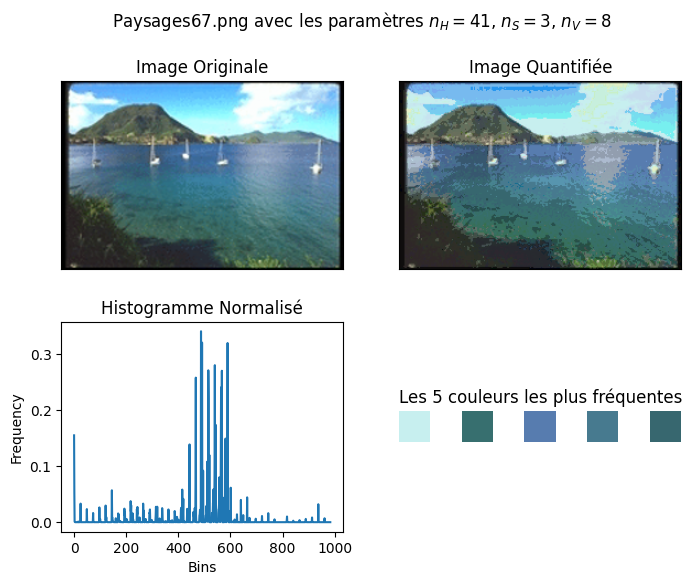

239.0625
[(np.int64(25), np.int64(0), np.int64(7)), (np.int64(30), np.int64(1), np.int64(5)), (np.int64(27), np.int64(1), np.int64(4)), (np.int64(25), np.int64(1), np.int64(3)), (np.int64(26), np.int64(1), np.int64(3))]


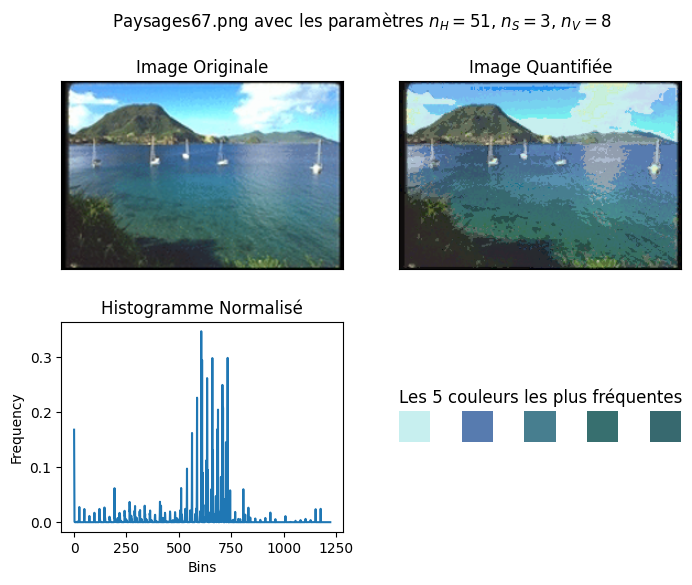

239.0625
[(np.int64(30), np.int64(0), np.int64(7)), (np.int64(36), np.int64(1), np.int64(5)), (np.int64(30), np.int64(1), np.int64(3)), (np.int64(32), np.int64(1), np.int64(4)), (np.int64(35), np.int64(1), np.int64(4))]


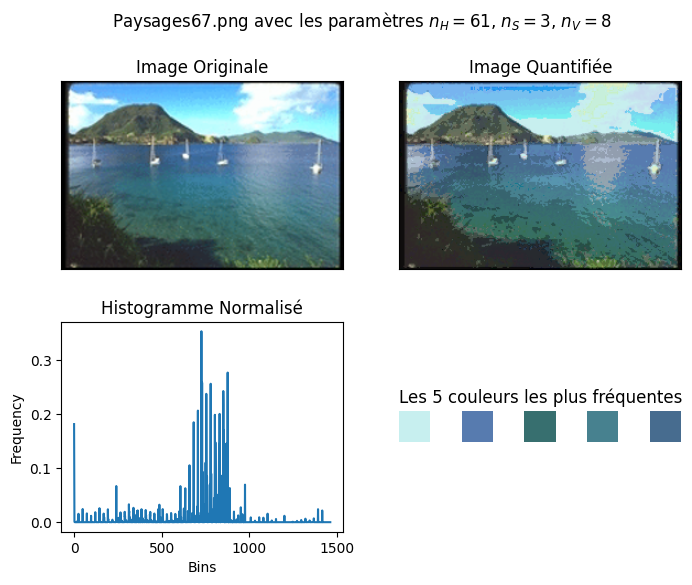

239.0625
[(np.int64(35), np.int64(0), np.int64(7)), (np.int64(42), np.int64(1), np.int64(5)), (np.int64(38), np.int64(1), np.int64(4)), (np.int64(35), np.int64(1), np.int64(3)), (np.int64(41), np.int64(1), np.int64(4))]


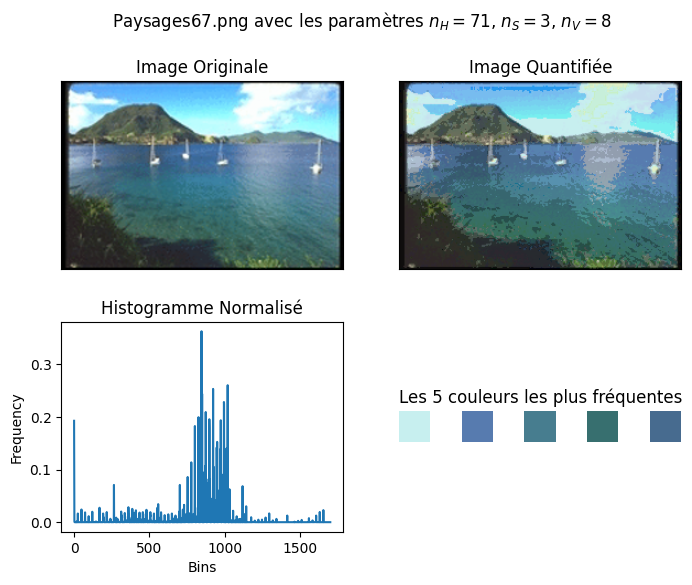

239.0625
[(np.int64(40), np.int64(0), np.int64(7)), (np.int64(43), np.int64(1), np.int64(4)), (np.int64(47), np.int64(1), np.int64(5)), (np.int64(48), np.int64(1), np.int64(5)), (np.int64(47), np.int64(1), np.int64(4))]


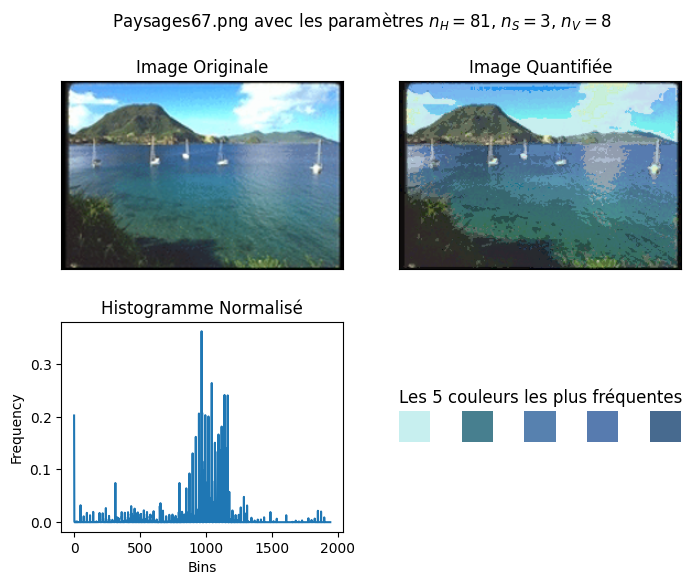

239.0625
[(np.int64(45), np.int64(0), np.int64(7)), (np.int64(53), np.int64(1), np.int64(5)), (np.int64(54), np.int64(1), np.int64(5)), (np.int64(0), np.int64(0), np.int64(0)), (np.int64(49), np.int64(1), np.int64(4))]


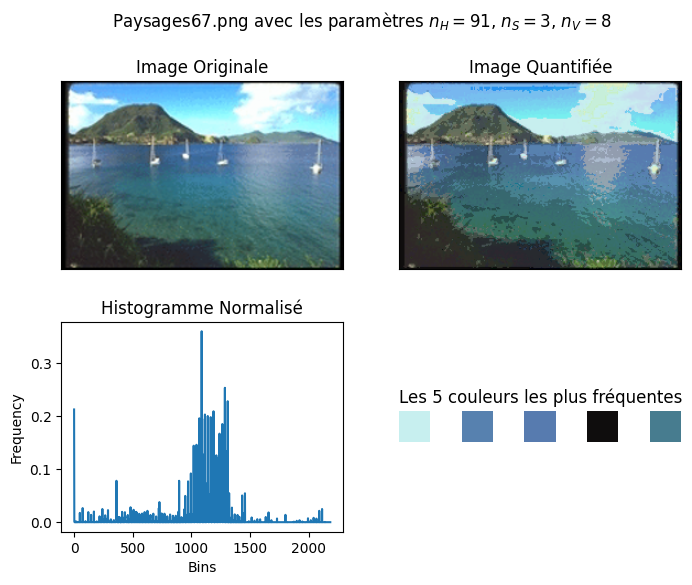

In [7]:
# changement de valeurs de nH
for nH in range(1,101,10):
    afficheHSV("Paysages67.png", nH, 3, 8)

239.0625
[(np.int64(6), np.int64(0), np.int64(7)), (np.int64(6), np.int64(0), np.int64(4)), (np.int64(6), np.int64(0), np.int64(3)), (np.int64(5), np.int64(0), np.int64(3)), (np.int64(7), np.int64(0), np.int64(5))]


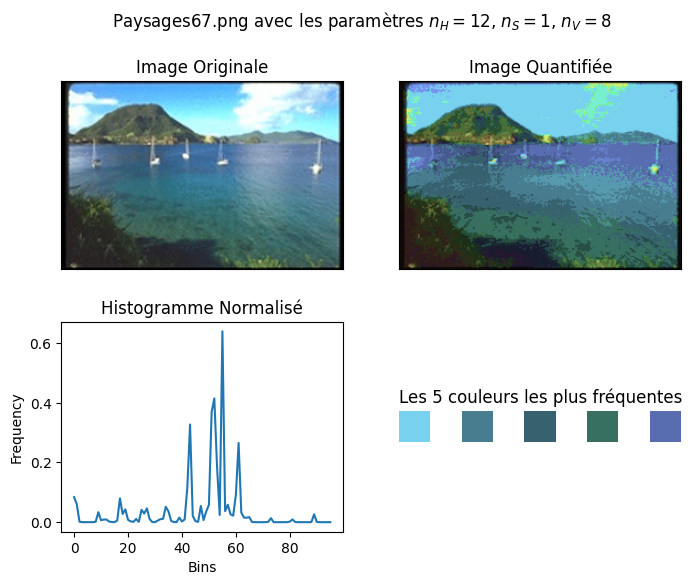

239.0625
[(np.int64(5), np.int64(4), np.int64(3)), (np.int64(6), np.int64(4), np.int64(4)), (np.int64(6), np.int64(5), np.int64(3)), (np.int64(6), np.int64(2), np.int64(7)), (np.int64(6), np.int64(6), np.int64(3))]


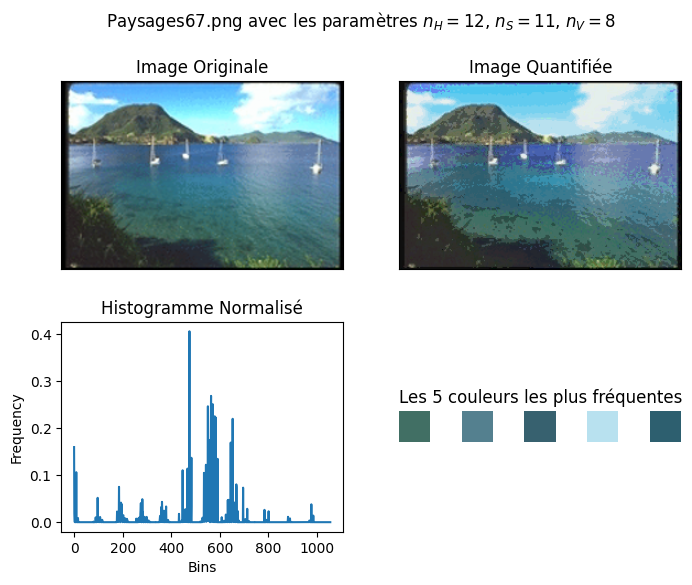

239.0625
[(np.int64(5), np.int64(8), np.int64(3)), (np.int64(5), np.int64(9), np.int64(3)), (np.int64(6), np.int64(11), np.int64(3)), (np.int64(6), np.int64(9), np.int64(4)), (np.int64(7), np.int64(8), np.int64(5))]


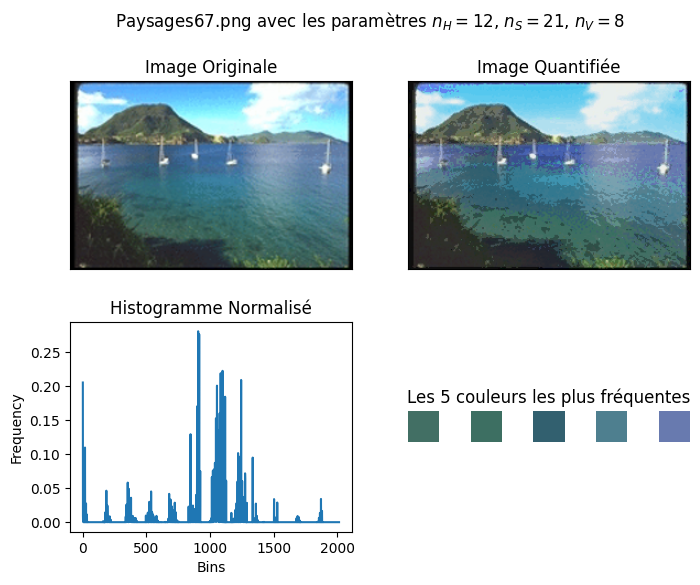

239.0625
[(np.int64(5), np.int64(13), np.int64(3)), (np.int64(5), np.int64(12), np.int64(3)), (np.int64(0), np.int64(0), np.int64(0)), (np.int64(7), np.int64(12), np.int64(5)), (np.int64(5), np.int64(14), np.int64(3))]


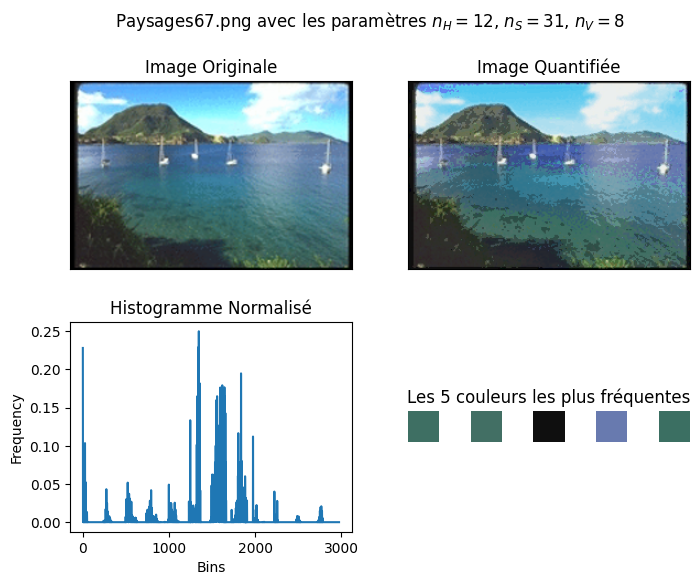

239.0625
[(np.int64(0), np.int64(0), np.int64(0)), (np.int64(5), np.int64(17), np.int64(3)), (np.int64(5), np.int64(16), np.int64(3)), (np.int64(7), np.int64(16), np.int64(5)), (np.int64(6), np.int64(22), np.int64(3))]


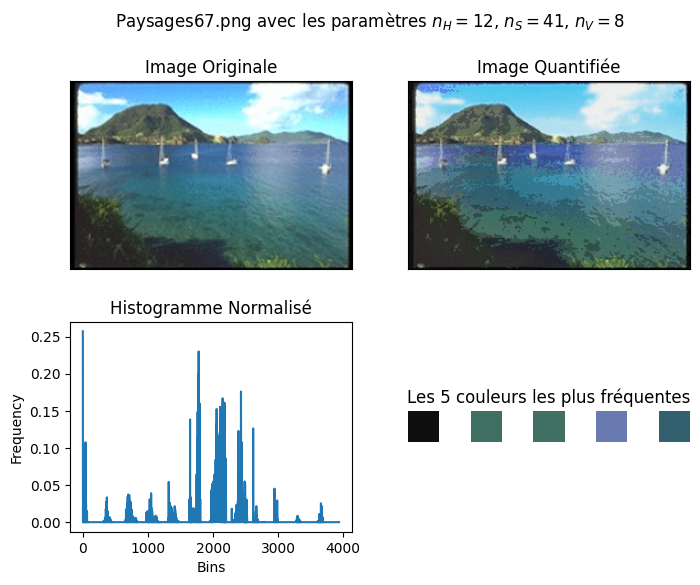

239.0625
[(np.int64(0), np.int64(0), np.int64(0)), (np.int64(5), np.int64(22), np.int64(3)), (np.int64(5), np.int64(21), np.int64(3)), (np.int64(5), np.int64(20), np.int64(3)), (np.int64(7), np.int64(20), np.int64(5))]


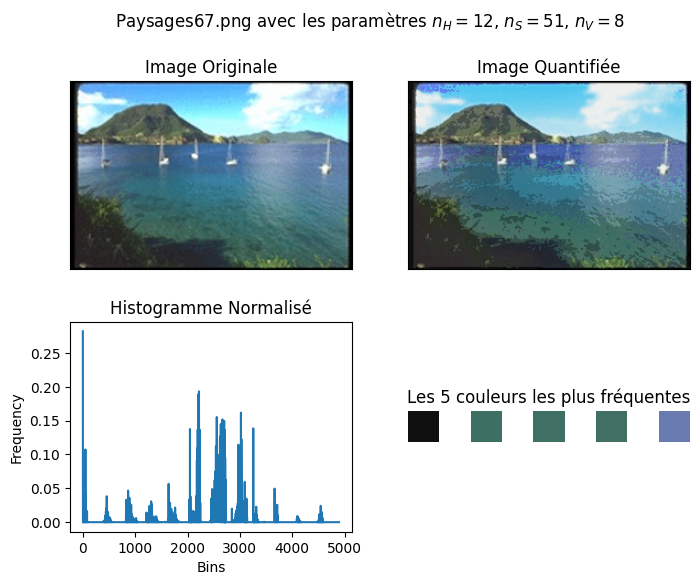

239.0625
[(np.int64(0), np.int64(0), np.int64(0)), (np.int64(5), np.int64(26), np.int64(3)), (np.int64(5), np.int64(25), np.int64(3)), (np.int64(7), np.int64(24), np.int64(5)), (np.int64(5), np.int64(24), np.int64(3))]


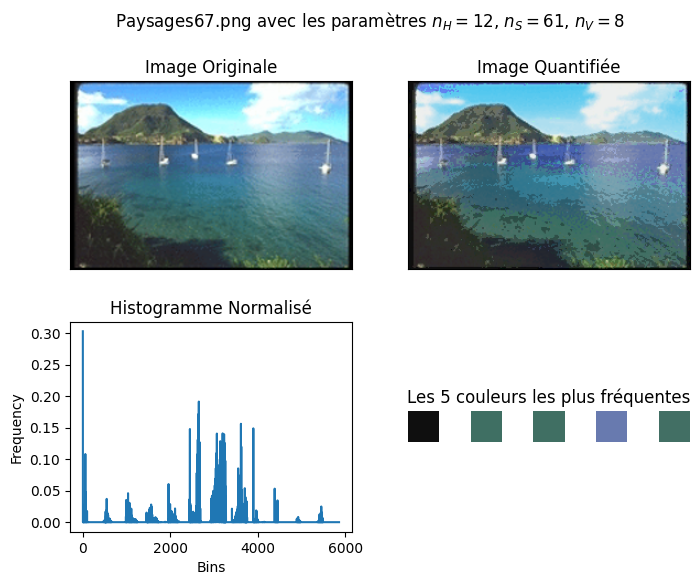

239.0625
[(np.int64(0), np.int64(0), np.int64(0)), (np.int64(5), np.int64(30), np.int64(3)), (np.int64(7), np.int64(70), np.int64(0)), (np.int64(5), np.int64(31), np.int64(3)), (np.int64(5), np.int64(0), np.int64(7))]


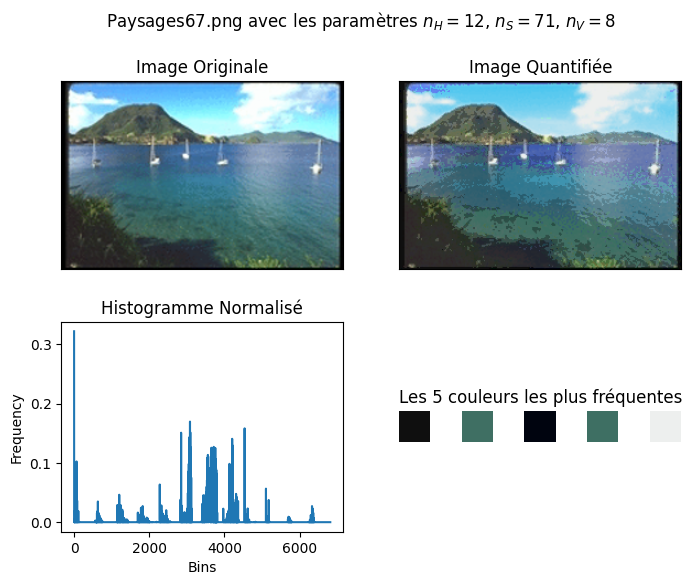

239.0625
[(np.int64(0), np.int64(0), np.int64(0)), (np.int64(5), np.int64(35), np.int64(3)), (np.int64(7), np.int64(80), np.int64(0)), (np.int64(5), np.int64(0), np.int64(7)), (np.int64(5), np.int64(34), np.int64(3))]


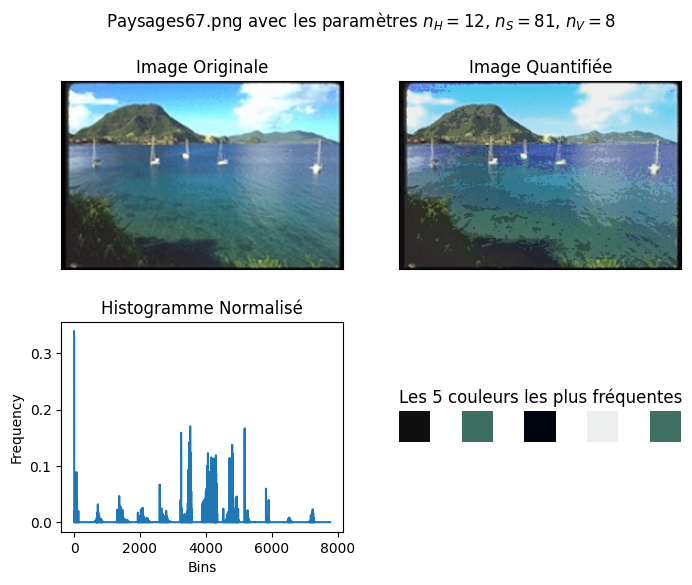

239.0625
[(np.int64(0), np.int64(0), np.int64(0)), (np.int64(5), np.int64(39), np.int64(3)), (np.int64(7), np.int64(90), np.int64(0)), (np.int64(5), np.int64(0), np.int64(7)), (np.int64(6), np.int64(24), np.int64(7))]


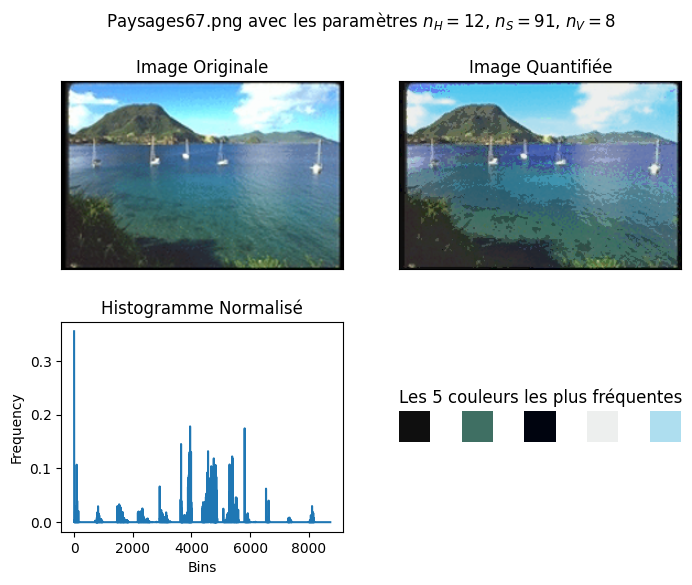

In [8]:
# changement de valeurs de nS
for nS in range(1,101,10):
    afficheHSV("Paysages67.png", 12, nS, 8)

127.5
[(np.int64(6), np.int64(1), np.int64(0)), (np.int64(6), np.int64(0), np.int64(0)), (np.int64(5), np.int64(1), np.int64(0)), (np.int64(7), np.int64(1), np.int64(0)), (np.int64(7), np.int64(0), np.int64(0))]


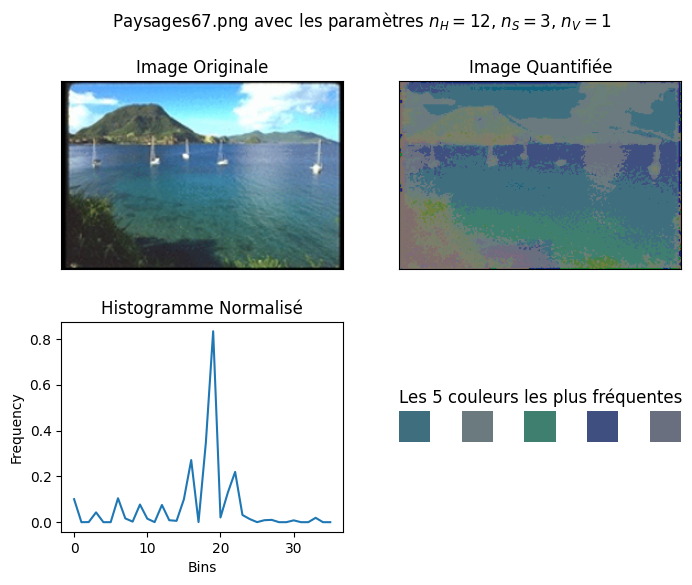

243.40909090909088
[(np.int64(6), np.int64(1), np.int64(5)), (np.int64(6), np.int64(1), np.int64(10)), (np.int64(5), np.int64(1), np.int64(4)), (np.int64(6), np.int64(0), np.int64(10)), (np.int64(6), np.int64(1), np.int64(6))]


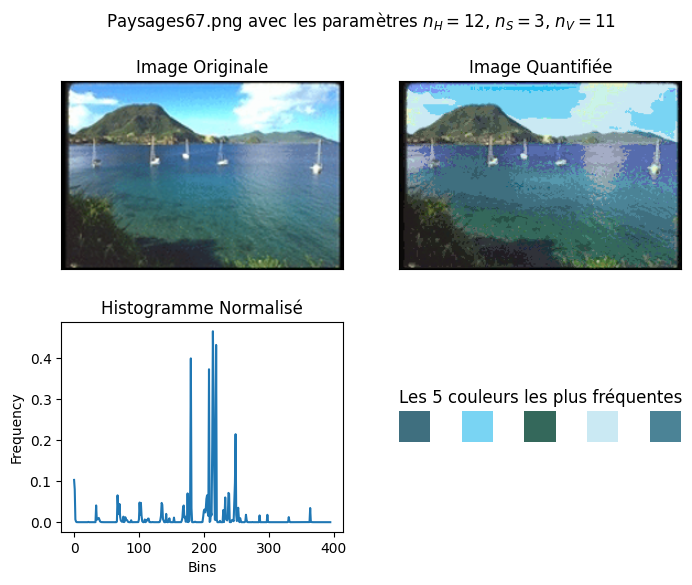

248.92857142857142
[(np.int64(6), np.int64(1), np.int64(20)), (np.int64(6), np.int64(0), np.int64(20)), (np.int64(5), np.int64(1), np.int64(8)), (np.int64(6), np.int64(1), np.int64(9)), (np.int64(6), np.int64(1), np.int64(10))]


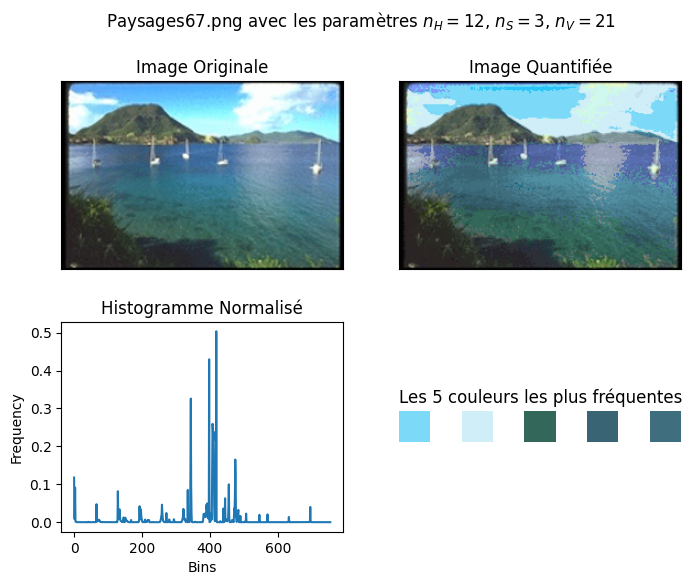

250.88709677419357
[(np.int64(6), np.int64(1), np.int64(30)), (np.int64(6), np.int64(0), np.int64(30)), (np.int64(5), np.int64(1), np.int64(12)), (np.int64(6), np.int64(1), np.int64(14)), (np.int64(6), np.int64(1), np.int64(18))]


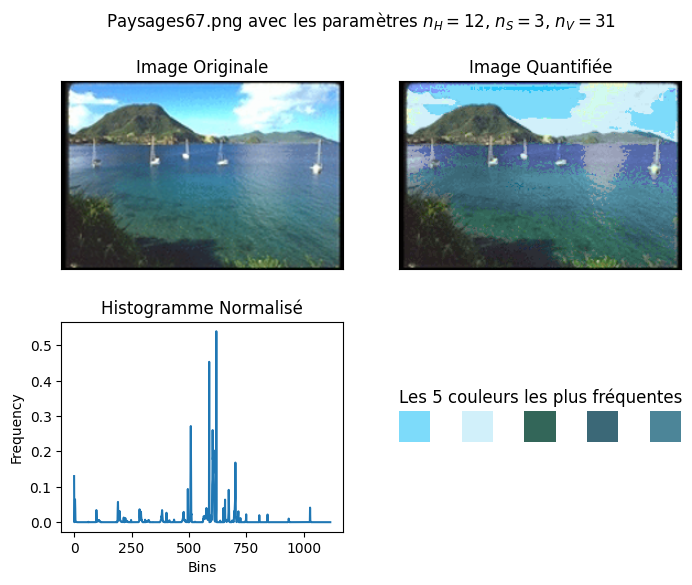

251.890243902439
[(np.int64(6), np.int64(1), np.int64(40)), (np.int64(6), np.int64(0), np.int64(40)), (np.int64(6), np.int64(1), np.int64(19)), (np.int64(5), np.int64(1), np.int64(16)), (np.int64(6), np.int64(1), np.int64(24))]


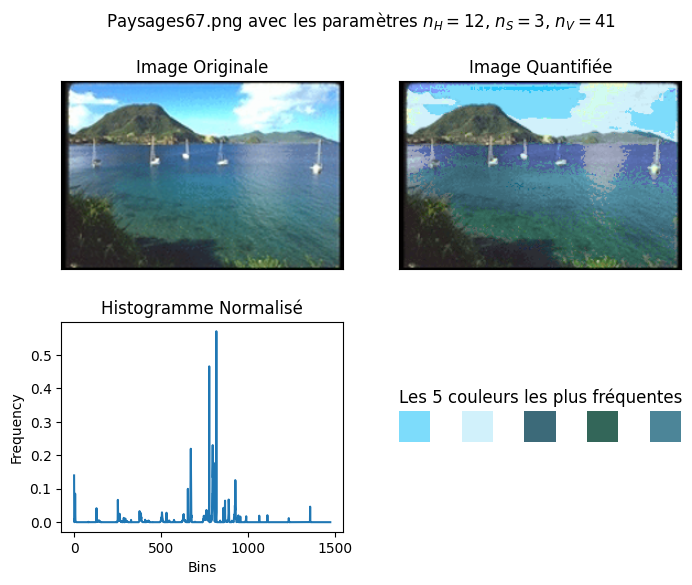

252.49999999999997
[(np.int64(6), np.int64(1), np.int64(50)), (np.int64(6), np.int64(0), np.int64(50)), (np.int64(5), np.int64(1), np.int64(20)), (np.int64(6), np.int64(1), np.int64(30)), (np.int64(6), np.int64(1), np.int64(23))]


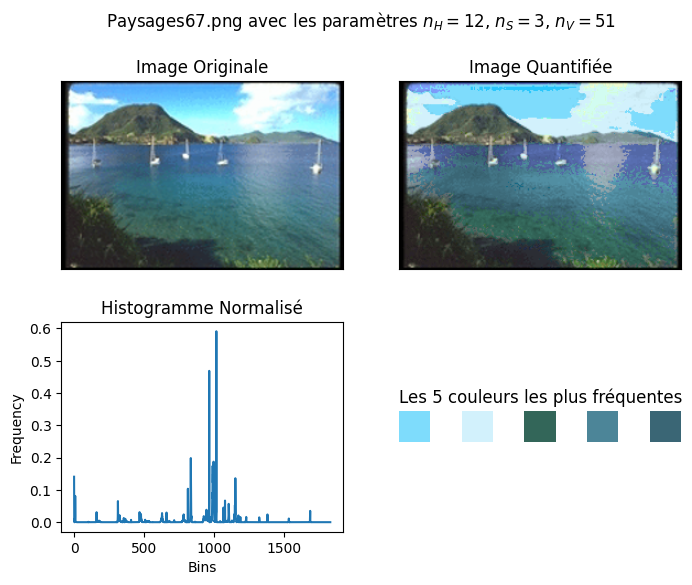

252.90983606557376
[(np.int64(6), np.int64(1), np.int64(60)), (np.int64(6), np.int64(0), np.int64(60)), (np.int64(6), np.int64(1), np.int64(28)), (np.int64(5), np.int64(1), np.int64(23)), (np.int64(5), np.int64(1), np.int64(24))]


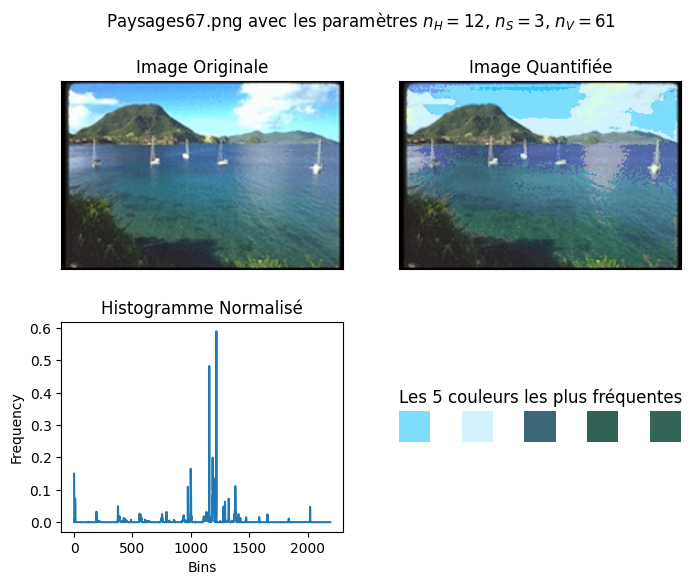

253.20422535211267
[(np.int64(6), np.int64(1), np.int64(70)), (np.int64(6), np.int64(0), np.int64(70)), (np.int64(6), np.int64(1), np.int64(33)), (np.int64(5), np.int64(1), np.int64(27)), (np.int64(5), np.int64(1), np.int64(28))]


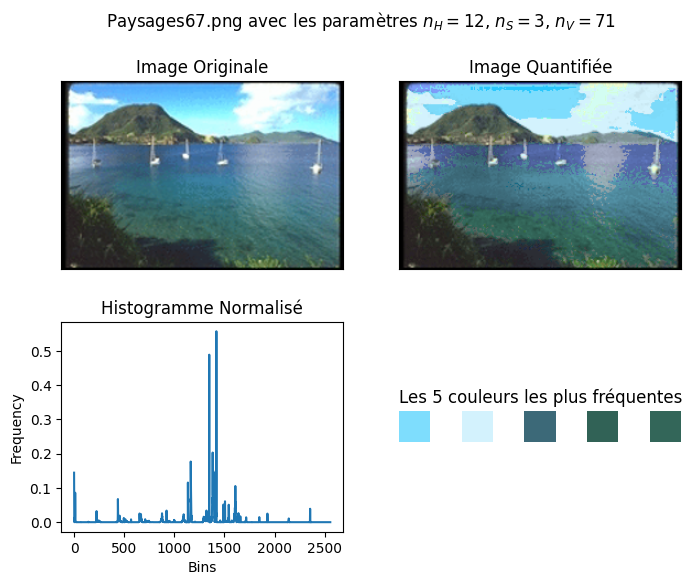

253.42592592592592
[(np.int64(6), np.int64(1), np.int64(80)), (np.int64(6), np.int64(0), np.int64(80)), (np.int64(6), np.int64(1), np.int64(37)), (np.int64(6), np.int64(1), np.int64(47)), (np.int64(5), np.int64(1), np.int64(31))]


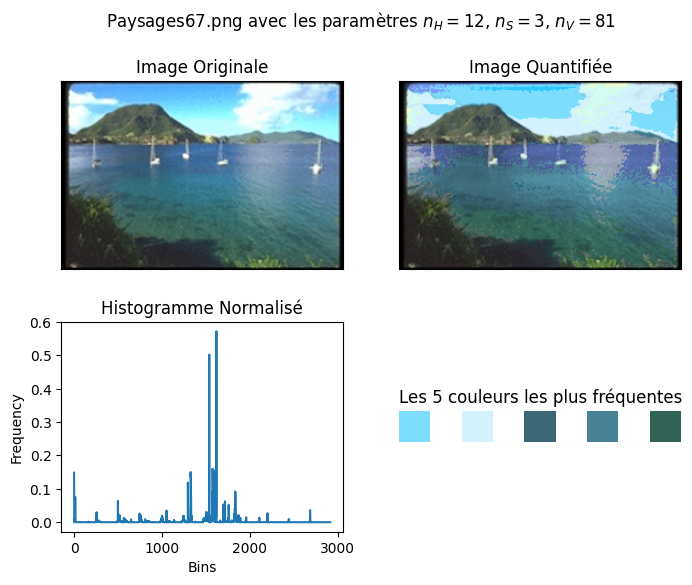

253.5989010989011
[(np.int64(6), np.int64(1), np.int64(90)), (np.int64(6), np.int64(0), np.int64(90)), (np.int64(6), np.int64(1), np.int64(89)), (np.int64(6), np.int64(1), np.int64(42)), (np.int64(0), np.int64(0), np.int64(0))]


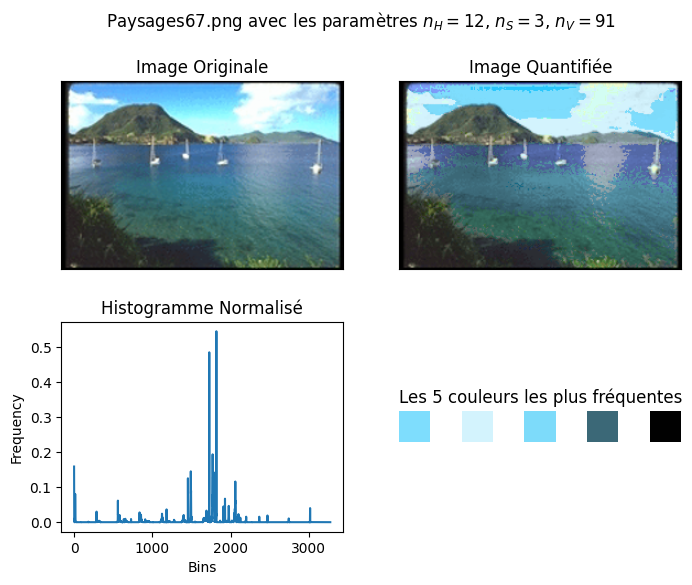

In [9]:
# changement de valeurs de nV
for nV in range(1,101,10):
    afficheHSV("Paysages67.png", 12, 3, nV)

6) What can you say about the results?

Your answer: 

As we know Hue represents the color type, Saturation indicates the intensity of the color, and Value refers to the brightness of the color. 

- Variations of $H$ : 
    - Increasing `nH` results in more hue bins, which allows for a finer distinction between different colors, therefore retaining more of the original image's color diversity.
    - Decreasing ``nH`` leads to a more significant blending of similar colors into single bins, causing distinct colors to merge, simplifying the image's color diversity but potentially losing detail.
- Variations of $S$: 
    - Regarding S, it distributes color along the histogram but has less impact on the quantized image.  
    - Increasing ``nS`` more saturation bins allows the quantized image to differentiate more clearly between vivid and muted colors, maintaining the vibrancy of the original image in the quantized version. High values of $S$ help to represent shades, but dominant colors may become very similar.
    - Decreasing ``nS`` makes the colors look more uniform and less vibrant (it reduces the visual impact of saturation differences.) Low values force all hues to be considered as a single average value, broadening the range of dominant colors.
- Variations of $V$ : 
    - Increasing ``nV``, more bins for brightness levels allows to more accurately represent variations in lightness and darkness, preserving details visible through brightness.
    - Decreasing ``nV`` reduces the number of brightness levels available, so it loses detail in darker or lighter areas as different shades may collapse into a single brightness bin.


Consider the three quantized images with the sets of parameters of $(15, 5, 10)$,  $(100, 50, 130)$, and $(3, 4, 2)$, the third quantized image looks too primative comparing to the original image. That is because of the low ``nH`` (losing gradients), low ``nS`` (colors are dead and not vivid), and low ``nV`` (obscures details in the darker areas of the ocean and lighter areas of the sky). On the other hand, in the second image, the quantized image looks nearly like the original image. thats because all the $H,V,S$ have enough bins to keep the details we want.

242.25000000000003
[(np.int64(7), np.int64(2), np.int64(4)), (np.int64(8), np.int64(2), np.int64(6)), (np.int64(8), np.int64(2), np.int64(5)), (np.int64(7), np.int64(1), np.int64(9)), (np.int64(7), np.int64(0), np.int64(9))]


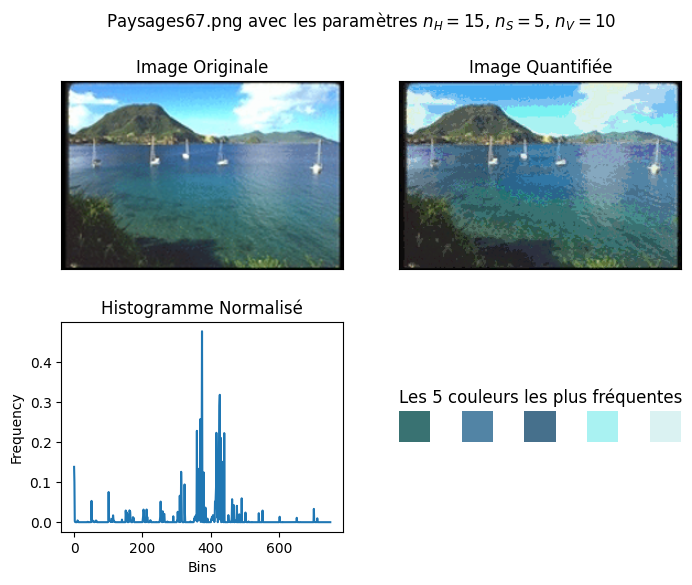

254.01923076923077
[(np.int64(0), np.int64(0), np.int64(0)), (np.int64(41), np.int64(0), np.int64(129)), (np.int64(56), np.int64(31), np.int64(129)), (np.int64(50), np.int64(11), np.int64(129)), (np.int64(54), np.int64(28), np.int64(129))]


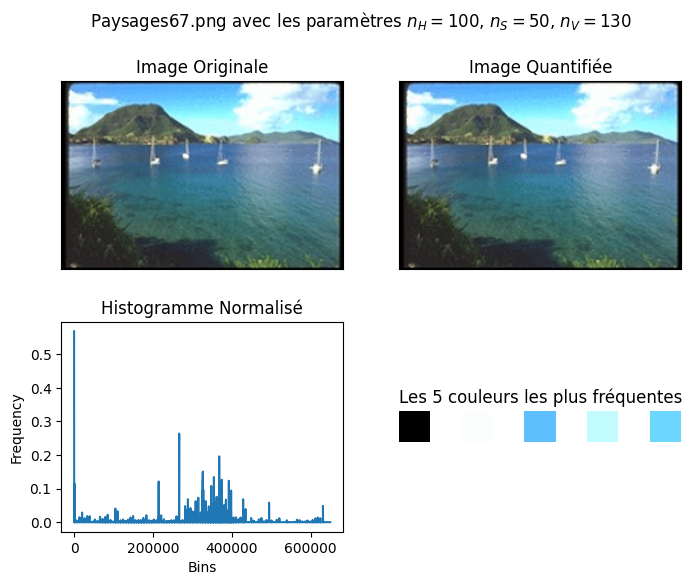

191.25
[(np.int64(1), np.int64(1), np.int64(1)), (np.int64(1), np.int64(1), np.int64(0)), (np.int64(1), np.int64(2), np.int64(1)), (np.int64(0), np.int64(0), np.int64(0)), (np.int64(1), np.int64(0), np.int64(1))]


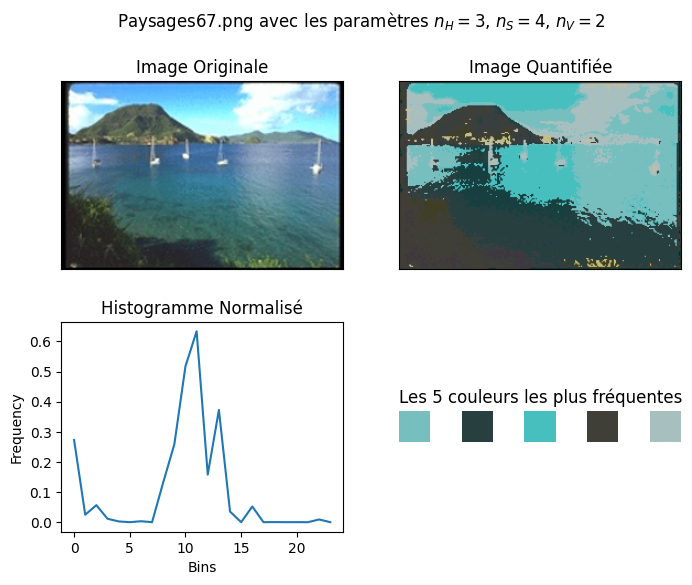

In [10]:
afficheHSV("Paysages67.png", 15, 5, 10)
afficheHSV("Paysages67.png", 100, 50, 130)
afficheHSV("Paysages67.png", 3, 4, 2)

If we increase only one of the parameters, we still cannot get the quality we need-- as it is experimented in the cell below. As we see, in the cases below, at least one of the main colors of the palette is near black (for example the quantization range for value gets divided too finely, the lower end of the value spectrum is expanded, therefore more bins representing various dark shades.)

242.25000000000003
[(np.int64(0), np.int64(0), np.int64(0)), (np.int64(351), np.int64(1), np.int64(9)), (np.int64(350), np.int64(0), np.int64(9)), (np.int64(291), np.int64(0), np.int64(9)), (np.int64(116), np.int64(0), np.int64(1))]


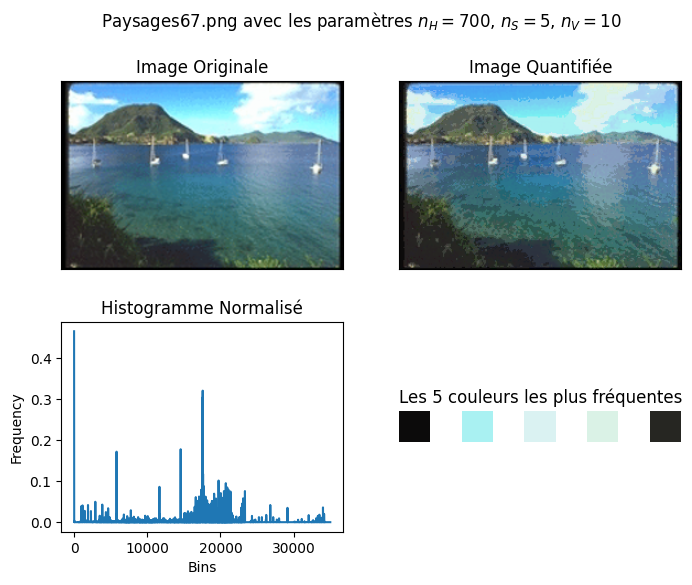

242.25000000000003
[(np.int64(0), np.int64(0), np.int64(0)), (np.int64(6), np.int64(499), np.int64(0)), (np.int64(4), np.int64(3), np.int64(9)), (np.int64(0), np.int64(60), np.int64(1)), (np.int64(5), np.int64(319), np.int64(6))]


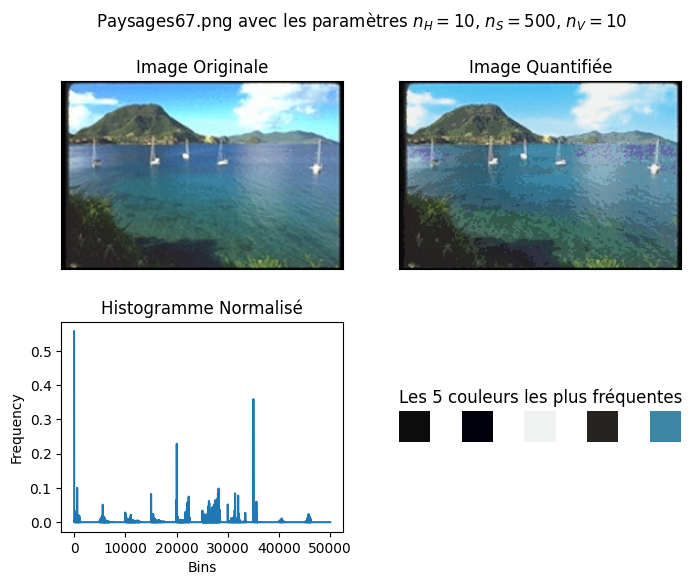

254.68125
[(np.int64(5), np.int64(1), np.int64(398)), (np.int64(5), np.int64(2), np.int64(398)), (np.int64(5), np.int64(3), np.int64(398)), (np.int64(5), np.int64(0), np.int64(398)), (np.int64(0), np.int64(0), np.int64(1))]


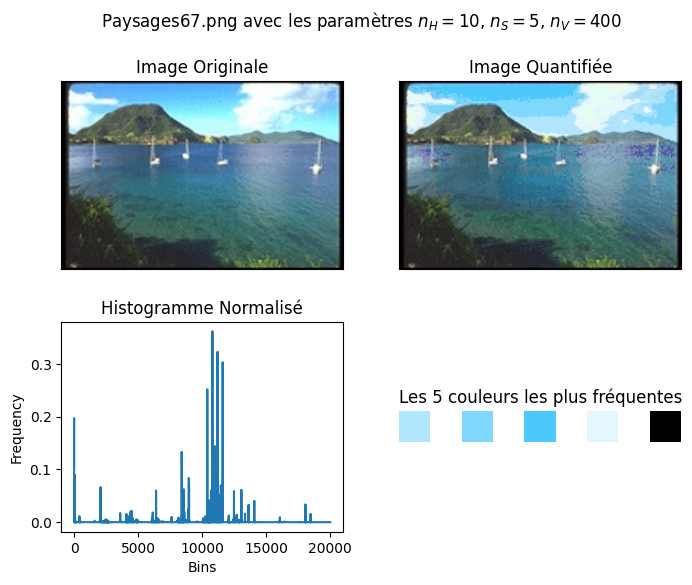

In [11]:
afficheHSV("Paysages67.png", 700, 5, 10)
afficheHSV("Paysages67.png", 10, 500, 10)
afficheHSV("Paysages67.png", 10, 5, 400)

On average, the values $H=12$, $S=3$, and $V=8$ provide acceptable results, balancing computational time and the amount of relevant information. Values that are too high or too low can lead to excessive alterations or make the quantization process unnecessary for certain tasks.

## Exercise 2: Similarity between images: 

In this exercise, we will compute a measure of similarity between two images from the normalized histogram. This measure of similarity will be used in order to find images that are the most similar to a given image.

### Question 2.1:  Computation of the histograms for the whole base

Complete the following script to compute the histograms for every image in the base. As the computation can take a lot of time, we will do it only one time and store the result in ```ListHisto.mat```. The results will be stored as a ```N x M``` array ```listHisto``` with ```N = 1040``` and ```M = nH x nS x nV ```. We will also save the names of the images as ```listImage```

Set ```bcomputed = False``` for the first run to compute the database histograms and then set it to 1.


In [12]:
import os
from scipy.io.matlab import loadmat, savemat
try:
    from tqdm.notebook import tqdm
except ImportError:
    print("tqdm not installed, you can install it with the following command:")
    print("  pip3 install tqdm --user")
    print("and remove it with the following command:")
    print("  pip3 unistall tqdm")


#####

pathImage = './Base/'
pathDescriptors = './'

# Quantization HSV
nH = 12
nS = 3
nV = 8

bcomputed = True # Set to False to compute the histogramm database

if not bcomputed:
    listImage = sorted(os.listdir(pathImage))
    listHisto = []
    print('Histogram database computation ... it may take a while ...')
    for imageName in listImage:
        if os.path.isfile(pathImage+imageName) and imageName[-4:] == '.png':
            # print( imageName)
            # read image
            I = np.array(Image.open(pathImage+imageName)) / 255.

            # conversion RGB->HSV
            J = rgb2hsv(I);
            # Image quantization (your function tested in Exo 1)
            _,histo = quantizeImage(J, nH, nS, nV)
  
            # flat a 3D histogram in 1D
            histo = histo.flatten()
            
            # Normalize histogramme (your function tested in Exo 1)
            listHisto.append(normalize(histo))

    print(len(listHisto), "histograms computed")
    nomList = pathDescriptors+'ListHisto.mat'
    savemat(nomList, {'listHisto': np.array(listHisto),
                      'listImage': np.array(listImage)})
else:
    print("Histogram database computation already done.")

Histogram database computation already done.


### Question 2.2: Computation of the similarity between every image in the base.

   1. Write a function ```similarityMatrix()``` or a script that performs the similarity computation for every pair of images in the base from the histograms stored in ```listHisto``` and store the result in a ```1040 x 1040``` matrix ```S```. It is possible to make the operation much faster by using only one matrix operation.

In [13]:
mat = loadmat(pathDescriptors+'ListHisto.mat')
listHisto = mat['listHisto']
listImage = mat['listImage']

### you code below
def similarityMatrix(listHisto):
    return np.matmul(listHisto, listHisto.T)


S = similarityMatrix(listHisto)
print(S.shape)
    

(1040, 1040)


2. Display the matrix `S`  as an image. What can we say about this it ?

Your answer: 

It shows how similar each image is to every other image based on their quantized HSV histograms.
The bright line along the diagonal from the top left to the bottom right indicates maximum similarity, representing each image's similarity with itself, which is always the highest. Also, darker areas indicate low similarity between those groups of images, suggesting that they differ significantly. 

Comparing a first sample image with a second image gives the same result as comparing the second image with the first. This explains the symmetry of the similarity matrix. From the clusters near the diagonal line, it can be inferred that images that appear similar are stored next to each other in the dataset.

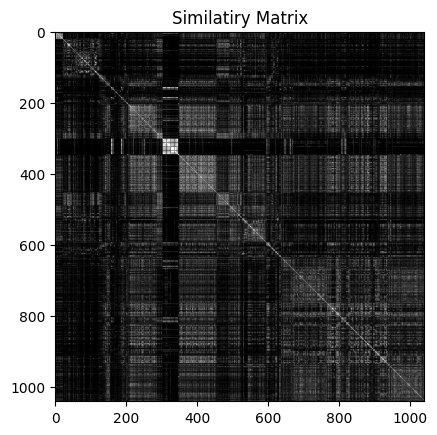

In [14]:
plt.imshow(S, cmap='gray')
plt.title("Similatiry Matrix")
plt.show()

3. Assuming `S` is already computed and using function `display20bestMatches()`, test on the image `Liontigre1.png` (indexQuery=349). You should obtain something similar to Figure 5.

![figure5.png](./figs/Figure_5.png)
<center>Figure 5: 20 best matches of image 'Liontigre1.png'</center>

Inquiring image Liontigre1.png (index 349)


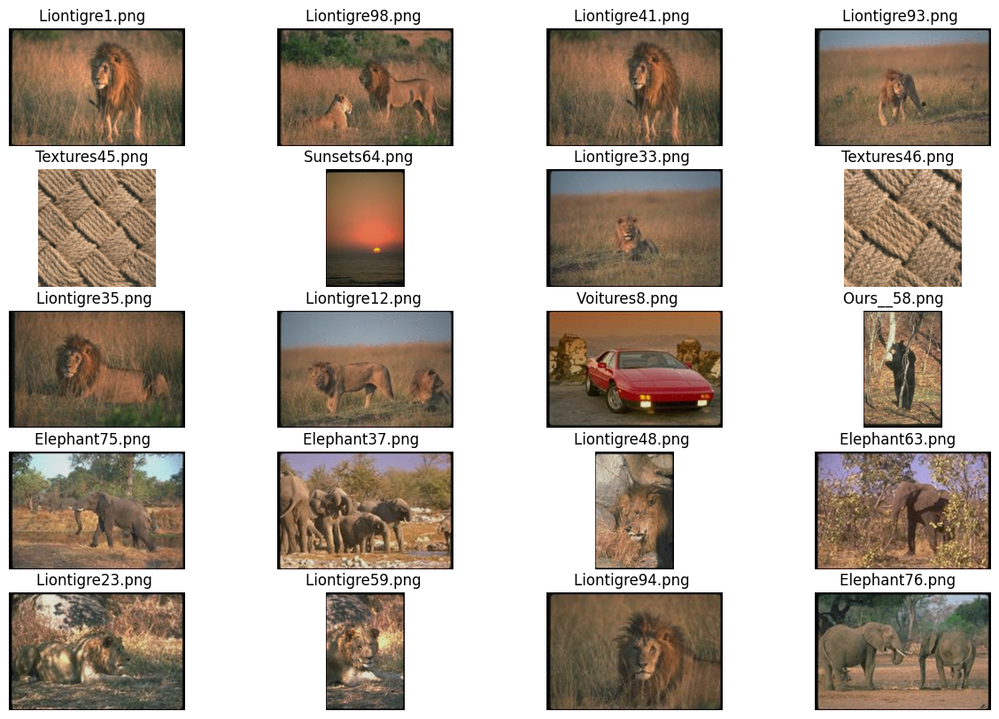

In [15]:
indexQuery = 349 
imageName = (pathImage+listImage[indexQuery]).strip()

print(f'Inquiring image {os.path.basename(imageName)} (index {indexQuery})')

display20bestMatches(S, indexQuery)


4. Assuming `S` is already computed, generate a random query (an integer in the range $[0, 1039]$), and display the 20 best matches.


./Base/Portraits72.png


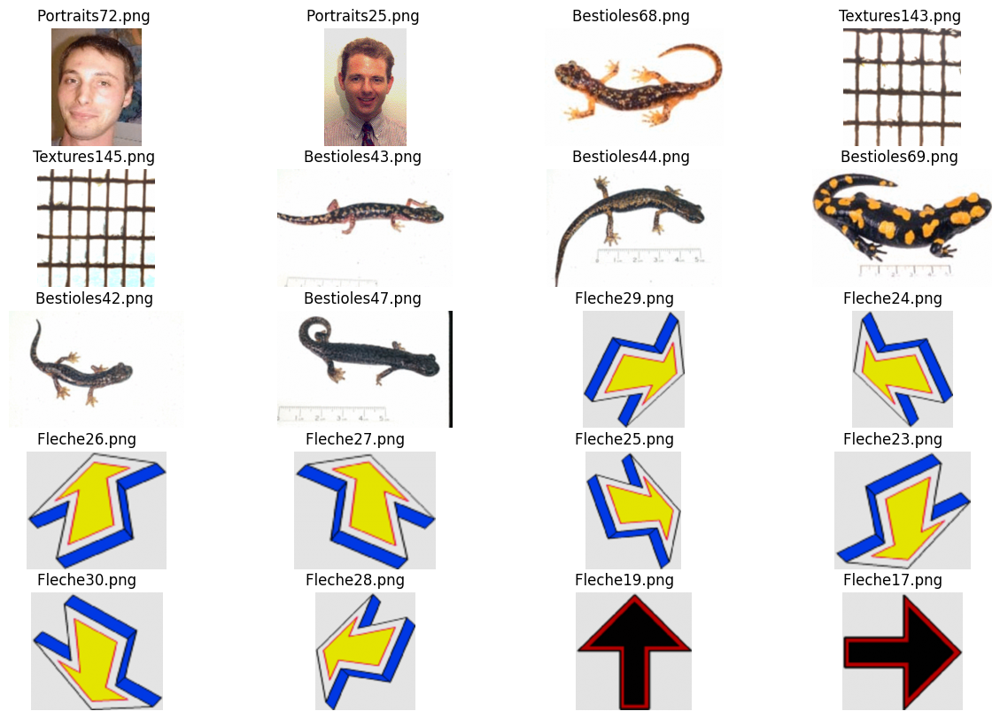

./Base/Voitures17.png


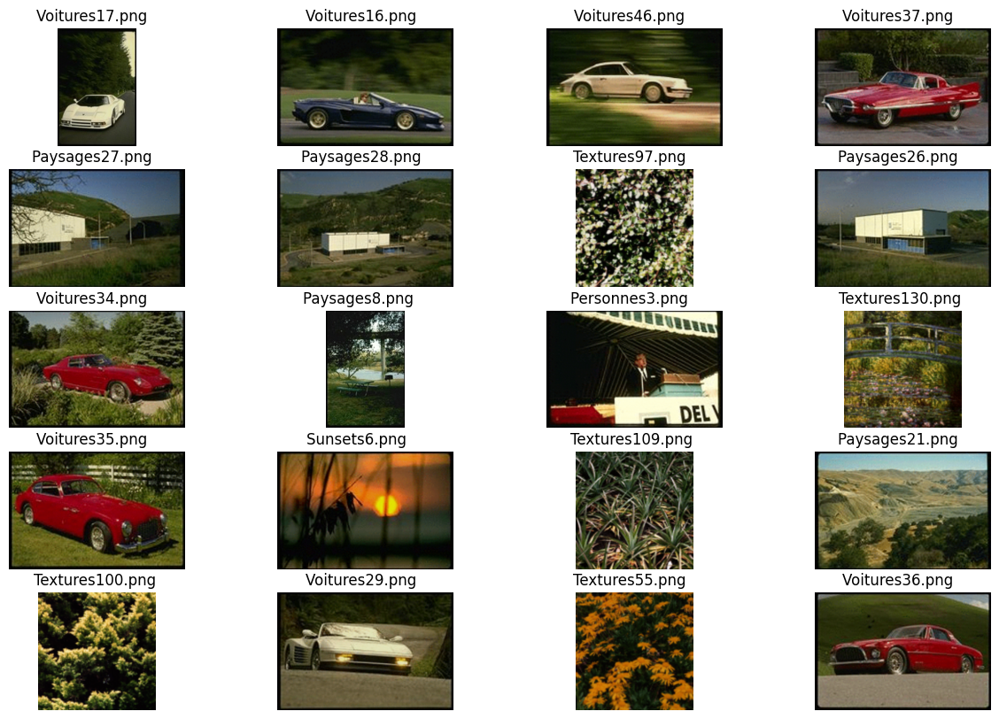

./Base/Personnes8.png


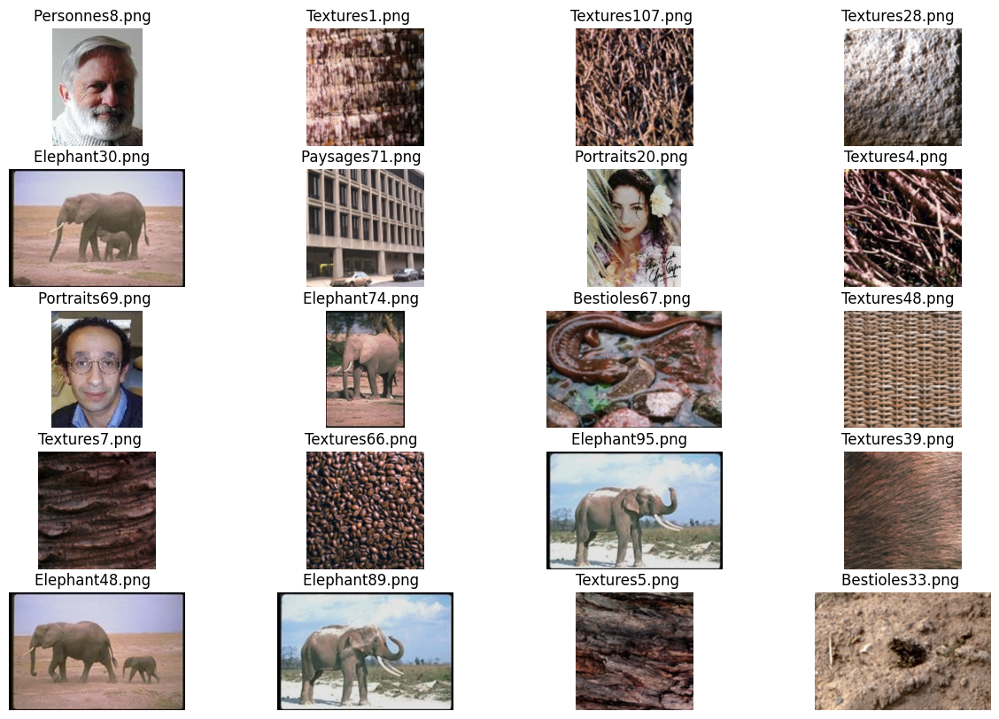

./Base/Liontigre44.png


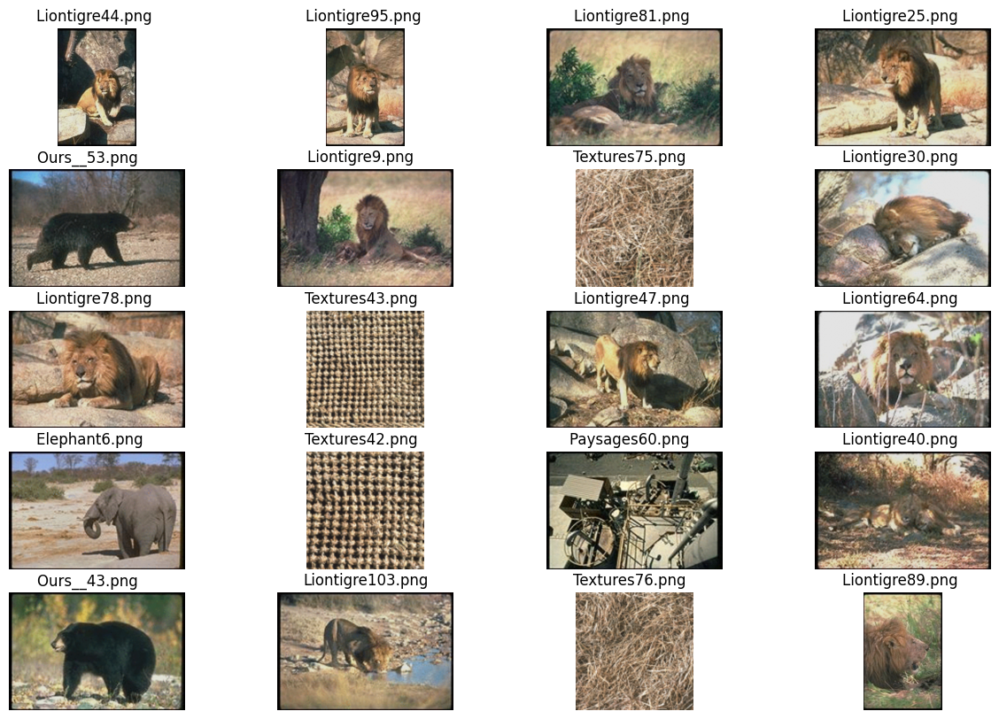

./Base/Avions84.png


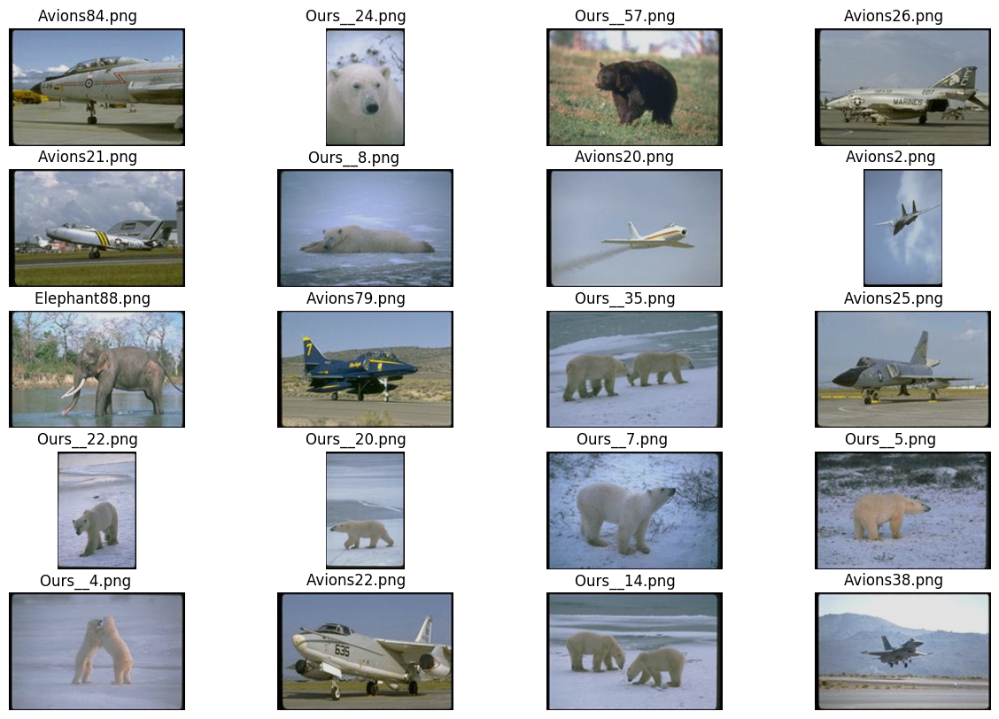

In [16]:
import random
for _ in range(5):
    indexQuery = random.randint(0, len(listImage))
    imageName = (pathImage+listImage[indexQuery]).strip()
    print(imageName)
    display20bestMatches(S, indexQuery)

5. What can you say about the results? What are the limitations and the advantages of this method?

Your answer: 

- **Advantages**:

    By using a similarity matrix that represents accurate image comparisons, the method can provide highly relevant results as we see. We can immediately see the most similar images to a query (This is particularly useful in databases where different content does not share the same color palettes like digital image libraries, online retail for similar product recommendation, ...).
    
- **Disadvantages**:

    It assumes that similarity can be accurately represented within the matrix. It doesn’t consider contextual information or semantic understanding which is necessary to determine relevance in certain applications (more than just visual and color similarity). There is also no mechanism for collecting user feedback to refine the search results, or learn over time. It should not be used for other purposes such as characterization or classification. Landscapes with large portions of sky will be categorized with airplanes because they appear in most of the images.